# 企鹅分类任务
[數據集](https://www.kaggle.com/datasets/parulpandey/palmer-archipelago-antarctica-penguin-data)


首先导入各种库

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

from sklearn.neighbors import KNeighborsClassifier

浅浅读取一下数据看看👀

可以看出该数据集包含三种企鹅物种的数据，分别为 Adelie、Chinstrap 和 Gentoo。每个样本记录了不同企鹅个体的生物特征，包括：喙的长度（culmen_length_mm）、喙的深度（culmen_depth_mm）、翅膀长度（flipper_length_mm）、体重（body_mass_g）性别（sex） 和 岛屿（island） 位置。

In [6]:
data = pd.read_csv('penguins_size.csv')
data.head()


,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


对数据进行深入分析，得到槟榔长度、体重、分布图，散点图，并清除缺失数据

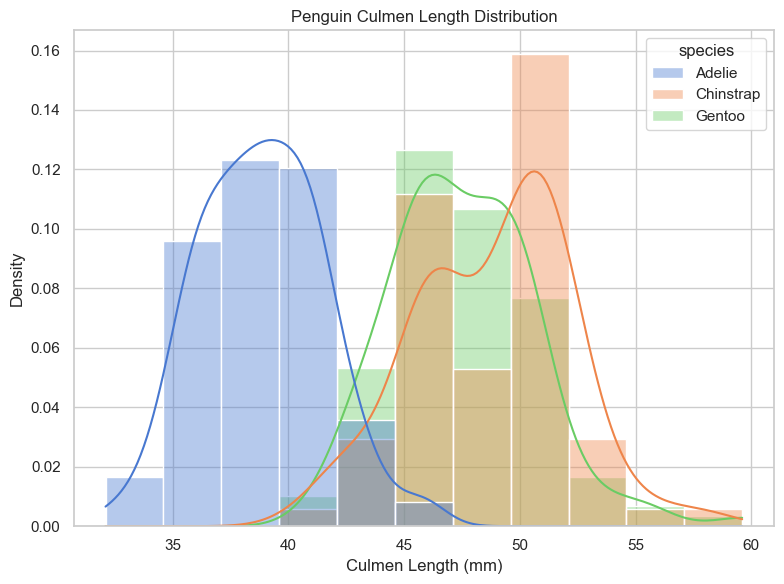

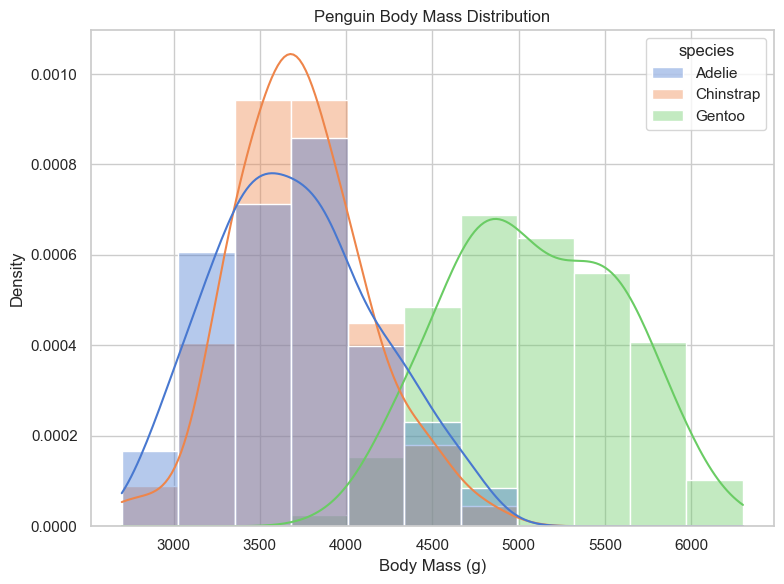

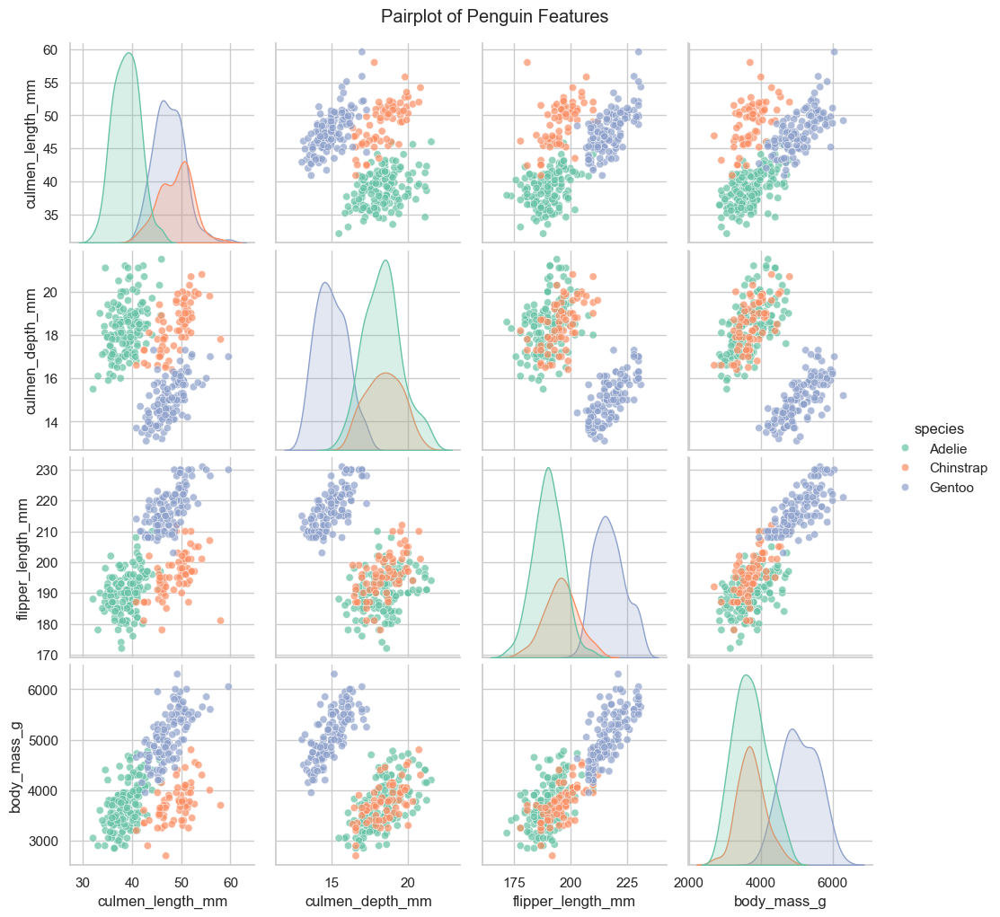

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# 数据清洗：移除缺失值
data = data.dropna()

# 设置样式
sns.set(style="whitegrid", palette="muted")

# 图1: 槟榔长度分布
plt.figure(figsize=(8, 6))
sns.histplot(data, x="culmen_length_mm", hue="species", kde=True, stat="density", alpha=0.4, common_norm=False)
plt.title("Penguin Culmen Length Distribution")
plt.xlabel("Culmen Length (mm)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

# 图2: 体重分布
plt.figure(figsize=(8, 6))
sns.histplot(data, x="body_mass_g", hue="species", kde=True, stat="density", alpha=0.4, common_norm=False)
plt.title("Penguin Body Mass Distribution")
plt.xlabel("Body Mass (g)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

# 图3: 散点图矩阵 (Pairplot)
g = sns.pairplot(data, hue="species", palette="Set2", plot_kws={"alpha": 0.7})
g.fig.suptitle("Pairplot of Penguin Features", y=1.02)
plt.show()

得到3D散点图

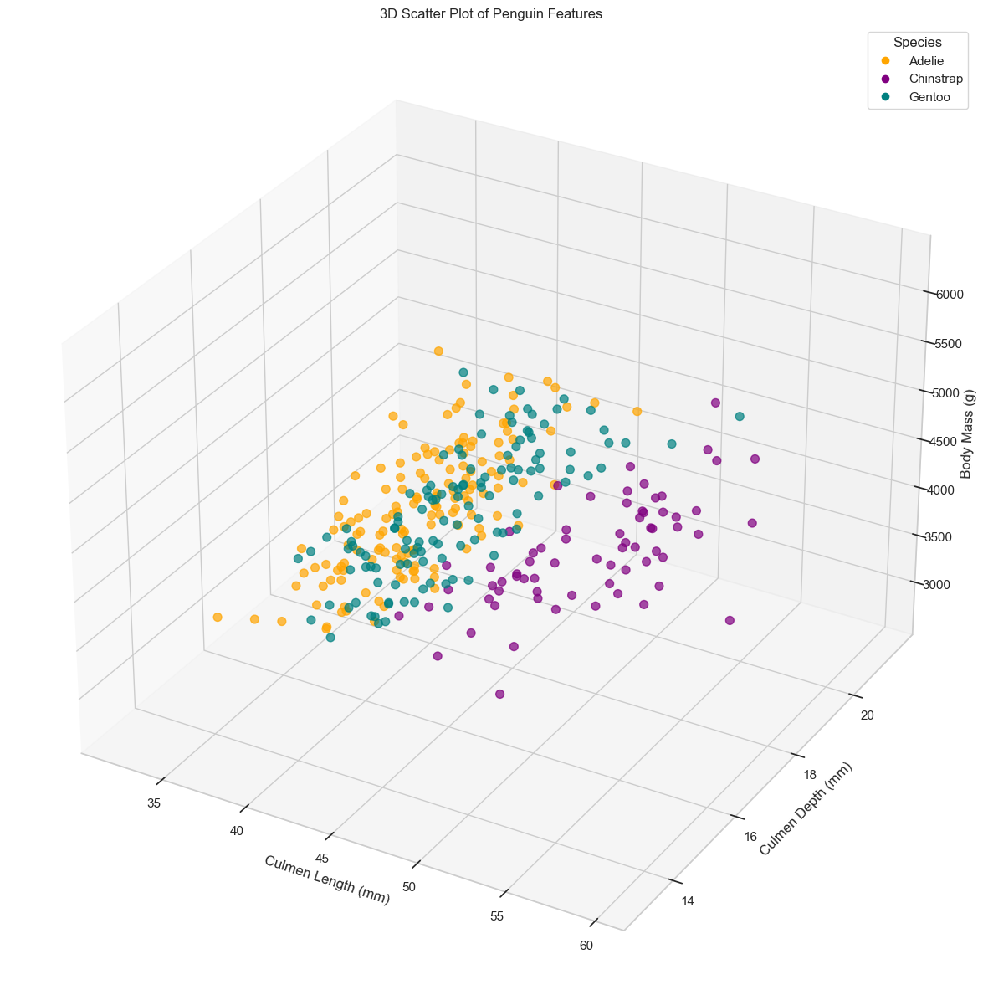

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Mapping species to colors for visualization
species_colors = {'Adelie': 'orange', 'Chinstrap': 'purple', 'Gentoo': 'teal'}
data['color'] = data['species'].map(species_colors)

# 3D Scatter Plot
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

# Plot data points
scatter = ax.scatter(data['culmen_length_mm'], 
                     data['culmen_depth_mm'], 
                     data['body_mass_g'], 
                     c=data['color'], 
                     s=50, alpha=0.7)

# Labels and Titles
ax.set_xlabel('Culmen Length (mm)')
ax.set_ylabel('Culmen Depth (mm)')
ax.set_zlabel('Body Mass (g)')
ax.set_title('3D Scatter Plot of Penguin Features')

# Custom legend
legend_labels = species_colors.keys()
legend_colors = species_colors.values()
scatter_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=c, markersize=8) 
                  for c in legend_colors]
ax.legend(scatter_legend, legend_labels, title="Species", loc='upper right')

plt.show()


得到热力图

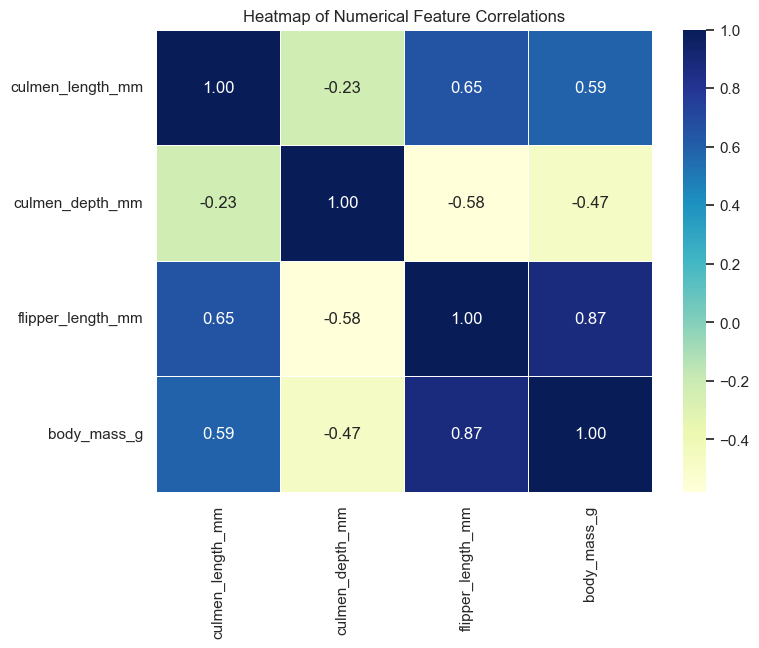

In [9]:
import seaborn as sns
import numpy as np

# Compute the correlation matrix for numerical columns
correlation_matrix = data[['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g']].corr()

# Heatmap Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)
plt.title('Heatmap of Numerical Feature Correlations')
plt.show()


数据集的平衡性分析

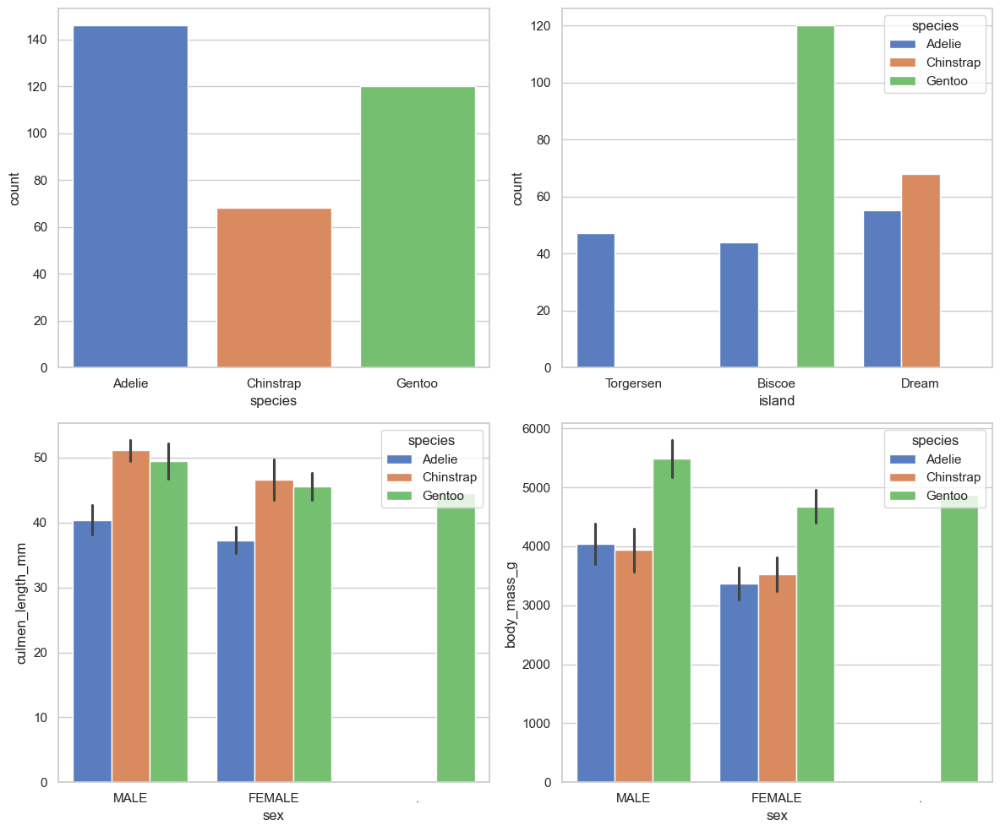

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 移除性别缺失的记录
data = data.dropna(subset=['sex', 'species'])
data = data.dropna(subset=['sex'])

# 设置样式
sns.set(style="whitegrid", palette="muted")

# 创建子图
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# 图1: 物种计数
sns.countplot(data=data, x="species", hue="species", palette="muted", legend=False, ax=axes[0, 0])

# 图2: 岛屿分布
sns.countplot(data=data, x="island", hue="species", palette="muted", ax=axes[0, 1])

# 图3: 喙长与性别
sns.barplot(data=data, x="sex", y="culmen_length_mm", hue="species", errorbar="sd", palette="muted", ax=axes[1, 0])

# 图4: 体重与性别
sns.barplot(data=data, x="sex", y="body_mass_g", hue="species", errorbar="sd", palette="muted", ax=axes[1, 1])

plt.tight_layout()
plt.show()

In [11]:
missing_sex = data[(data['species'] == 'Gentoo') & (data['sex'].isnull())]


下面是K-Means无监督学习

/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future

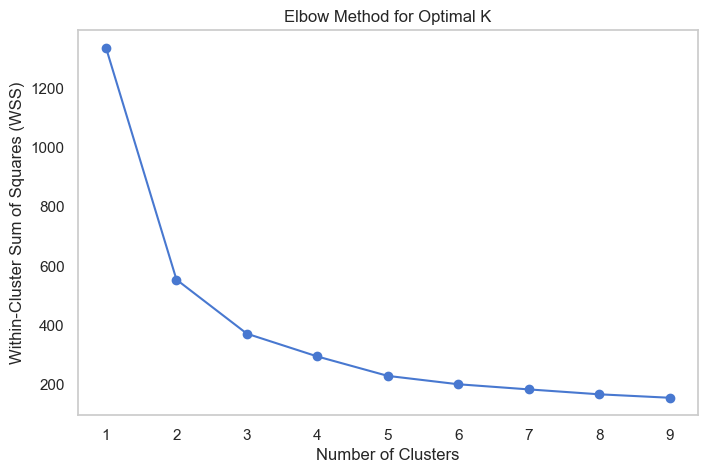

In [12]:

from sklearn.cluster import KMeans

# 数据预处理：选择数值特征并标准化
features = ['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g']
data = data.dropna()  # 去掉缺失值
X = data[features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 使用手肘法寻找最佳K值
wss = []  # 存储簇内误差平方和
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    wss.append(kmeans.inertia_)

# 绘制手肘法图
plt.figure(figsize=(8, 5))
plt.plot(range(1, 10), wss, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal K')
plt.grid()
plt.show()





(334, 3)


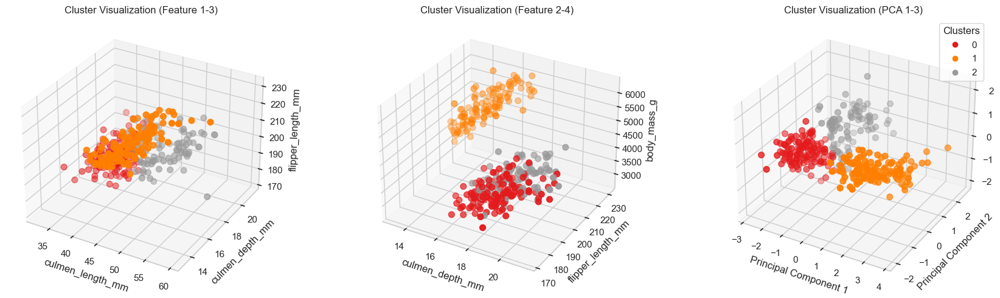

In [13]:
# 进行K-means聚类 (例如，假设K=3)
kmeans = KMeans(n_clusters=3, random_state=42)
data['cluster'] = kmeans.fit_predict(X_scaled)


# 创建3个3D散点图
fig = plt.figure(figsize=(18, 5))

# 图1：特征1, 2, 3
ax1 = fig.add_subplot(131, projection='3d')
scatter1 = ax1.scatter(data[features[0]], data[features[1]], data[features[2]], c=data['cluster'], cmap='Set1', s=50)
ax1.set_xlabel(features[0])
ax1.set_ylabel(features[1])
ax1.set_zlabel(features[2])
ax1.set_title('Cluster Visualization (Feature 1-3)')

# 图2：特征2, 3, 4
ax2 = fig.add_subplot(132, projection='3d')
scatter2 = ax2.scatter(data[features[1]], data[features[2]], data[features[3]], c=data['cluster'], cmap='Set1', s=50)
ax2.set_xlabel(features[1])
ax2.set_ylabel(features[2])
ax2.set_zlabel(features[3])
ax2.set_title('Cluster Visualization (Feature 2-4)')

# 图3：使用PCA降维至3D
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)
print(X_pca.shape)
ax3 = fig.add_subplot(133, projection='3d')
scatter3 = ax3.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=data['cluster'], cmap='Set1', s=50)
ax3.set_xlabel('Principal Component 1')
ax3.set_ylabel('Principal Component 2')
ax3.set_zlabel('Principal Component 3')
ax3.set_title('Cluster Visualization (PCA 1-3)')

#显示族群名称
plt.legend(*scatter3.legend_elements(), title="Clusters")

plt.tight_layout()
plt.show()


{0: 0, 2: 1, 1: 2}
准确率: 0.9191616766467066


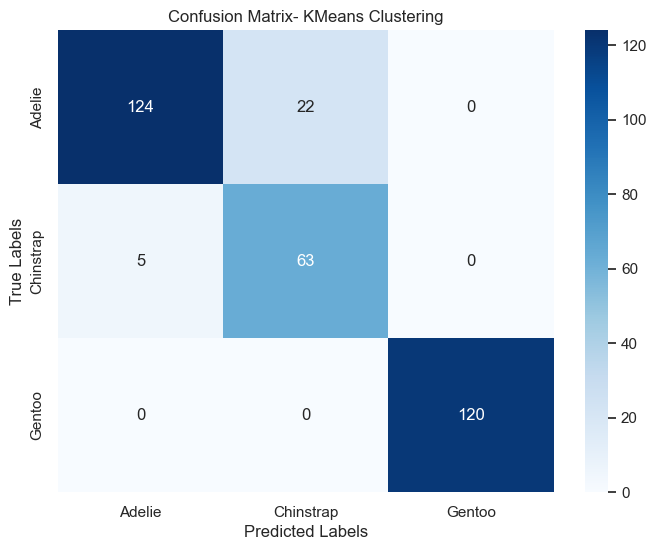

              precision    recall  f1-score   support

      Adelie       0.96      0.85      0.90       146
   Chinstrap       0.74      0.93      0.82        68
      Gentoo       1.00      1.00      1.00       120

    accuracy                           0.92       334
   macro avg       0.90      0.93      0.91       334
weighted avg       0.93      0.92      0.92       334



In [14]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
from scipy.optimize import linear_sum_assignment
import numpy as np

# 1. 提取真实标签 y_true
y_true = data['species']

le = LabelEncoder()
y_true_encoded = le.fit_transform(y_true)

# 3. 获取聚类结果 y_pred
y_pred = data['cluster']

# 4. 创建混淆矩阵
conf_mat = confusion_matrix(y_true_encoded, y_pred)

# 5. 使用匈牙利算法找到最佳标签映射
row_ind, col_ind = linear_sum_assignment(-conf_mat)
mapping = dict(zip(col_ind, row_ind))

# 映射聚类标签到真实标签
y_pred_mapped = y_pred.map(mapping)

#print 企鹅名字和聚类的映射关系。
print(mapping)



# 6. 计算准确率
accuracy = accuracy_score(y_true_encoded, y_pred_mapped)
print(f'准确率: {accuracy}')

# 7. 计算混淆矩阵
confusion_mat = confusion_matrix(y_true_encoded, y_pred_mapped)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix- KMeans Clustering')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

# 8. 生成分类报告
report = classification_report(y_true_encoded, y_pred_mapped, target_names=le.classes_)
#用表格形式展示分类报告
print(report)

In [15]:
from sklearn.metrics import roc_auc_score
from scipy.special import softmax

# 特异性计算
specificity = {}
for i in range(len(le.classes_)):
    tn = np.sum(confusion_mat) - (np.sum(confusion_mat[i, :]) + np.sum(confusion_mat[:, i]) - confusion_mat[i, i])
    fp = np.sum(confusion_mat[:, i]) - confusion_mat[i, i]
    specificity_score = tn / (tn + fp)
    specificity[le.classes_[i]] = specificity_score

print('各类别的特异性:')
for species, spec in specificity.items():
    print(f'{species}: {spec:.2f}')


各类别的特异性:
Adelie: 0.97
Chinstrap: 0.92
Gentoo: 1.00


有监督学习-决策树

决策树模型准确率: 0.9701492537313433

分类报告:
               precision    recall  f1-score   support

      Adelie       0.97      0.97      0.97        31
   Chinstrap       1.00      1.00      1.00        13
      Gentoo       0.96      0.96      0.96        23

    accuracy                           0.97        67
   macro avg       0.97      0.97      0.97        67
weighted avg       0.97      0.97      0.97        67



/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future

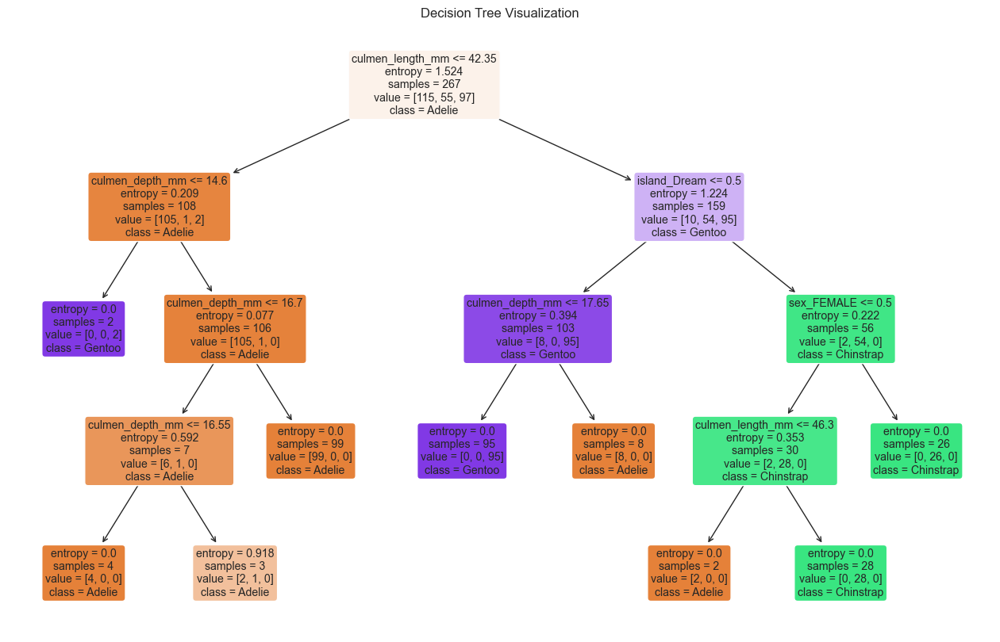

准确率: 0.9701492537313433
混淆矩阵:
[[30  0  1]
 [ 0 13  0]
 [ 1  0 22]]
各类别的特异性:
Adelie: 0.97
Chinstrap: 1.00
Gentoo: 0.98


In [16]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
#运用热编码将分类变量转换为数值变量
data = pd.get_dummies(data, columns=['island', 'sex'])

X = data[['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g','island_Dream','island_Torgersen','sex_FEMALE','sex_MALE']]  # 特征
y = data['species']  # 标签

# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 训练决策树模型
dtree = DecisionTreeClassifier(criterion='entropy', max_depth=None,max_features='log2',min_samples_leaf=1,min_samples_split=5, random_state=42)
dtree.fit(X_train, y_train)

# 预测测试集
y_pred = dtree.predict(X_test)

# 评估模型性能
print("决策树模型准确率:", accuracy_score(y_test, y_pred))
print("\n分类报告:\n", classification_report(y_test, y_pred))

# 可视化决策树
plt.figure(figsize=(16, 10))
plot_tree(dtree, feature_names=X.columns, class_names=dtree.classes_, filled=True, rounded=True)
plt.title("Decision Tree Visualization")
plt.show()
# 评估模型性能
accuracy = accuracy_score(y_test, y_pred)
print(f'准确率: {accuracy}')

conf_matrix = confusion_matrix(y_test, y_pred)
print('混淆矩阵:')
print(conf_matrix)

# 特异性计算
specificity = {}
for i in range(len(conf_matrix)):
    tn = np.sum(conf_matrix) - (np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i]) - conf_matrix[i, i])
    fp = np.sum(conf_matrix[:, i]) - conf_matrix[i, i]
    specificity_score = tn / (tn + fp)
    specificity[y.unique()[i]] = specificity_score

print('各类别的特异性:')
for species, spec in specificity.items():
    print(f'{species}: {spec:.2f}')

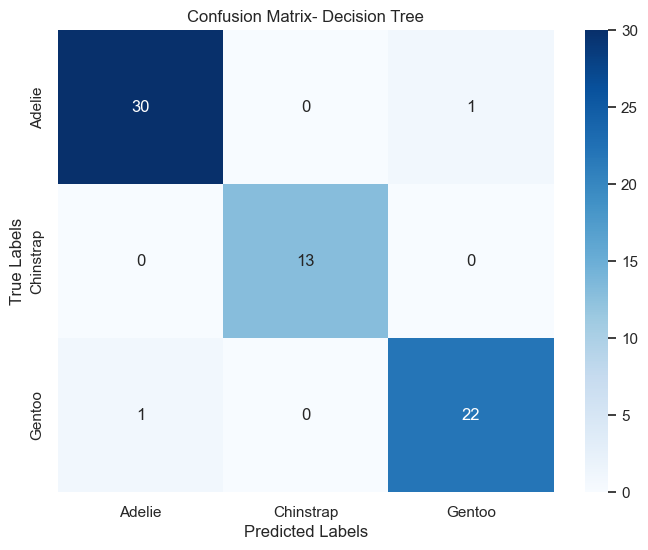

In [17]:
#生成混淆矩阵图
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=dtree.classes_, yticklabels=dtree.classes_)
plt.title('Confusion Matrix- Decision Tree')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

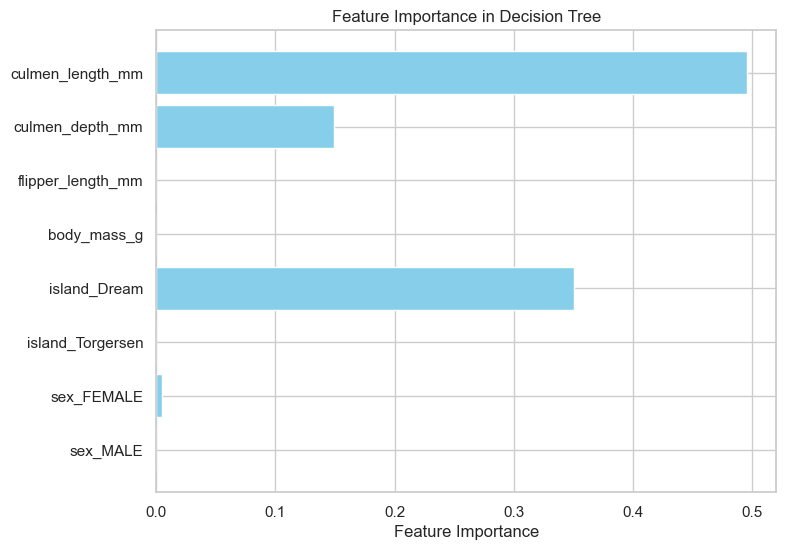

In [18]:
# Get feature importance from the trained decision tree
importances = dtree.feature_importances_
feature_names = X.columns

# Visualize feature importance
plt.figure(figsize=(8, 6))
plt.barh(feature_names, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Decision Tree')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


GridSearchCV找出决策树最优参数

In [19]:
X = data[['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g','island_Dream','island_Torgersen','sex_FEMALE','sex_MALE']]  # 特征
y = data['species']  # 标签
import warnings
warnings.filterwarnings('ignore')
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.model_selection import GridSearchCV
# 定义参数网格
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2', 2, 3, 4, 5, 6]
}

# 使用 GridSearchCV 进行参数搜索
grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                           param_grid=param_grid,
                           cv=5,
                           n_jobs=-1,
                           verbose=0)

# 训练模型
grid_search.fit(X_train, y_train)

# 输出最优参数
print(f'最优参数: {grid_search.best_params_}')

# 使用最优参数训练模型
best_model = grid_search.best_estimator_

# 预测
y_pred = best_model.predict(X_test)

# 评估模型性能
accuracy = accuracy_score(y_test, y_pred)
print(f'准确率: {accuracy}')

conf_matrix = confusion_matrix(y_test, y_pred)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_test, y_pred)
print('分类报告:')
print(report)



/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future

最优参数: {'criterion': 'entropy', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2}
准确率: 0.9701492537313433
混淆矩阵:
[[30  0  1]
 [ 0 13  0]
 [ 1  0 22]]
分类报告:
              precision    recall  f1-score   support

      Adelie       0.97      0.97      0.97        31
   Chinstrap       1.00      1.00      1.00        13
      Gentoo       0.96      0.96      0.96        23

    accuracy                           0.97        67
   macro avg       0.97      0.97      0.97        67
weighted avg       0.97      0.97      0.97        67



/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future

随机森林

/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mbny/anaconda3/envs/ai/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a

最优参数: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
准确率: 1.0
混淆矩阵:
[[31  0  0]
 [ 0 13  0]
 [ 0  0 23]]
分类报告:
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00        31
   Chinstrap       1.00      1.00      1.00        13
      Gentoo       1.00      1.00      1.00        23

    accuracy                           1.00        67
   macro avg       1.00      1.00      1.00        67
weighted avg       1.00      1.00      1.00        67

各类别的特异性:
Adelie: 1.00
Chinstrap: 1.00
Gentoo: 1.00


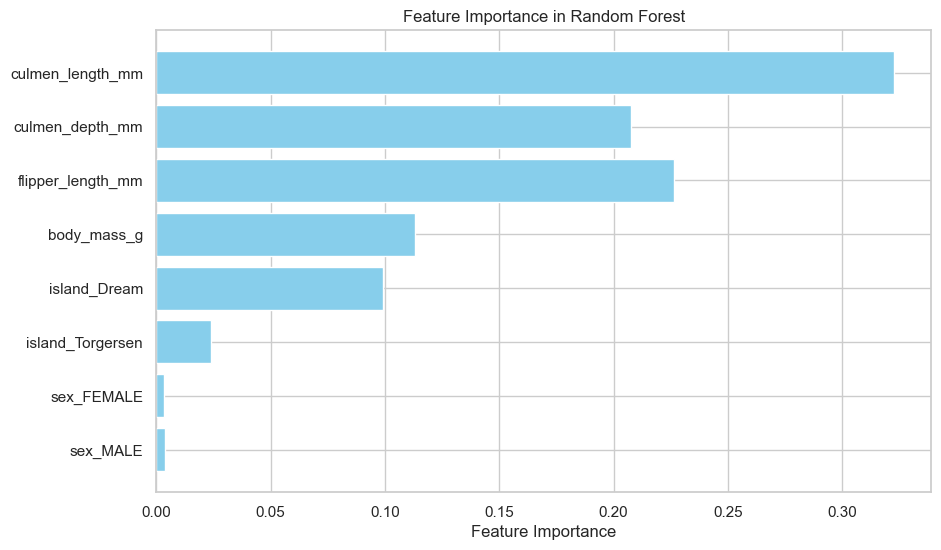

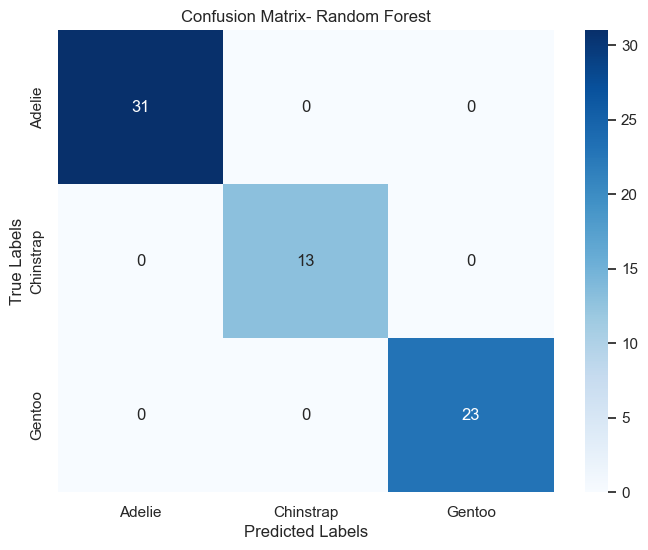

In [20]:

from sklearn.ensemble import RandomForestClassifier 
#定义参数网格
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# 使用 GridSearchCV 进行参数搜索
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42),
                           param_grid=param_grid,
                           cv=5,
                           n_jobs=-1,
                           verbose=0)
#禁止输出警告
import warnings
warnings.filterwarnings('ignore')

# 训练模型
grid_search.fit(X_train, y_train)

# 输出最优参数
print(f'最优参数: {grid_search.best_params_}')

# 使用最优参数训练模型
best_model = grid_search.best_estimator_

# 预测
y_pred = best_model.predict(X_test)

# 评估模型性能
accuracy = accuracy_score(y_test, y_pred)
print(f'准确率: {accuracy}')

conf_matrix = confusion_matrix(y_test, y_pred)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_test, y_pred)
print('分类报告:')
print(report)

# 特异性计算
specificity = {}
for i in range(len(conf_matrix)):
    tn = np.sum(conf_matrix) - (np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i]) - conf_matrix[i, i])
    fp = np.sum(conf_matrix[:, i]) - conf_matrix[i, i]
    specificity_score = tn / (tn + fp)
    specificity[y.unique()[i]] = specificity_score

print('各类别的特异性:')
for species, spec in specificity.items():
    print(f'{species}: {spec:.2f}')

# 可视化特征重要性
importances = best_model.feature_importances_
feature_names = X.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Random Forest')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

# 生成混淆矩阵图
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=best_model.classes_, yticklabels=best_model.classes_)
plt.title('Confusion Matrix- Random Forest')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()


## KNN

准确率: 0.9850746268656716
混淆矩阵:
[[30  1  0]
 [ 0 13  0]
 [ 0  0 23]]
分类报告:
              precision    recall  f1-score   support

      Adelie       1.00      0.97      0.98        31
   Chinstrap       0.93      1.00      0.96        13
      Gentoo       1.00      1.00      1.00        23

    accuracy                           0.99        67
   macro avg       0.98      0.99      0.98        67
weighted avg       0.99      0.99      0.99        67

各类别的特异性:
Adelie: 1.00
Chinstrap: 0.98
Gentoo: 1.00


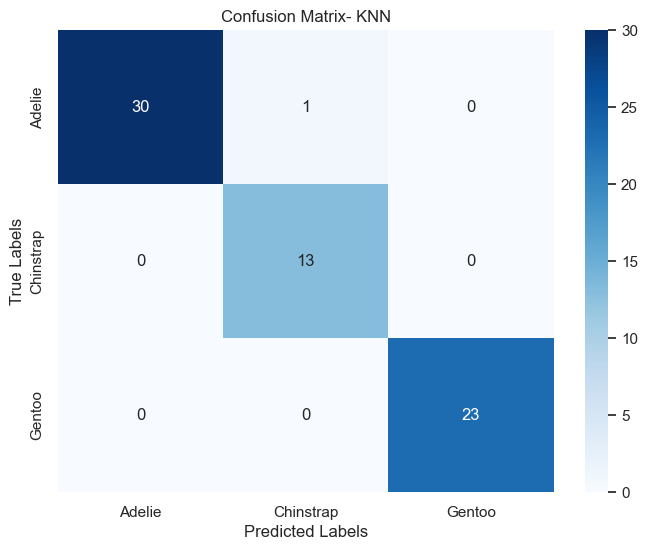

In [21]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 标准化特征
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 训练 KNN 模型
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# 预测
y_pred = knn.predict(X_test)

# 评估模型性能
accuracy = accuracy_score(y_test, y_pred)
print(f'准确率: {accuracy}')

conf_matrix = confusion_matrix(y_test, y_pred)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_test, y_pred)
print('分类报告:')
print(report)

# 特异性计算
specificity = {}
for i in range(len(conf_matrix)):
    tn = np.sum(conf_matrix) - (np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i]) - conf_matrix[i, i])
    fp = np.sum(conf_matrix[:, i]) - conf_matrix[i, i]
    specificity_score = tn / (tn + fp)
    specificity[y.unique()[i]] = specificity_score

print('各类别的特异性:')
for species, spec in specificity.items():
    print(f'{species}: {spec:.2f}')
# 生成混淆矩阵图
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.title('Confusion Matrix- KNN')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()


## MLP

In [22]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# 假设数据已经加载到 data 变量中
# data = pd.read_csv('path_to_your_data.csv')

# 标准化特征
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 标签编码
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.3, random_state=42)

# 转换为 PyTorch 张量
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# 创建数据加载器
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# 定义神经网络模型
class NeuralNet(nn.Module):
    def __init__(self, input_size, num_classes):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, num_classes)
    
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.relu(out)
        out = self.fc3(out)
        return out
# 初始化模型、损失函数和优化器
input_size = X_train.shape[1]
num_classes = len(le.classes_)
model = NeuralNet(input_size, num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
NeuralNet_loss = []
# 训练模型
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    for X_batch, y_batch in train_loader:
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
    NeuralNet_loss
# 评估模型
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        _, predicted = torch.max(outputs.data, 1)
        total += y_batch.size(0)
        correct += (predicted == y_batch).sum().item()

    accuracy = correct / total
    print(f'准确率: {accuracy:.4f}')

# 混淆矩阵和分类报告
y_pred_list = []
y_true_list = []
model.eval()
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        _, predicted = torch.max(outputs.data, 1)
        y_pred_list.extend(predicted.cpu().numpy())
        y_true_list.extend(y_batch.cpu().numpy())

conf_matrix = confusion_matrix(y_true_list, y_pred_list)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_true_list, y_pred_list, target_names=le.classes_)
print('分类报告:')
print(report)

Epoch [1/100], Loss: 1.0672
Epoch [2/100], Loss: 1.0460
Epoch [3/100], Loss: 0.8961
Epoch [4/100], Loss: 0.8504
Epoch [5/100], Loss: 0.6807
Epoch [6/100], Loss: 0.5712
Epoch [7/100], Loss: 0.3221
Epoch [8/100], Loss: 0.4459
Epoch [9/100], Loss: 0.3910
Epoch [10/100], Loss: 0.1684
Epoch [11/100], Loss: 0.1508
Epoch [12/100], Loss: 0.0941
Epoch [13/100], Loss: 0.1463
Epoch [14/100], Loss: 0.0673
Epoch [15/100], Loss: 0.1541
Epoch [16/100], Loss: 0.0302
Epoch [17/100], Loss: 0.0853
Epoch [18/100], Loss: 0.0602
Epoch [19/100], Loss: 0.0907
Epoch [20/100], Loss: 0.0149
Epoch [21/100], Loss: 0.1011
Epoch [22/100], Loss: 0.0120
Epoch [23/100], Loss: 0.0721
Epoch [24/100], Loss: 0.0235
Epoch [25/100], Loss: 0.0071
Epoch [26/100], Loss: 0.0053
Epoch [27/100], Loss: 0.0065
Epoch [28/100], Loss: 0.0045
Epoch [29/100], Loss: 0.0347
Epoch [30/100], Loss: 0.0065
Epoch [31/100], Loss: 0.0052
Epoch [32/100], Loss: 0.0072
Epoch [33/100], Loss: 0.0069
Epoch [34/100], Loss: 0.0037
Epoch [35/100], Loss: 0

In [23]:
print(model)

NeuralNet(
  (fc1): Linear(in_features=8, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=3, bias=True)
)


混淆矩阵:
[[49  0  0]
 [ 0 18  0]
 [ 0  0 34]]
分类报告:
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00        49
   Chinstrap       1.00      1.00      1.00        18
      Gentoo       1.00      1.00      1.00        34

    accuracy                           1.00       101
   macro avg       1.00      1.00      1.00       101
weighted avg       1.00      1.00      1.00       101



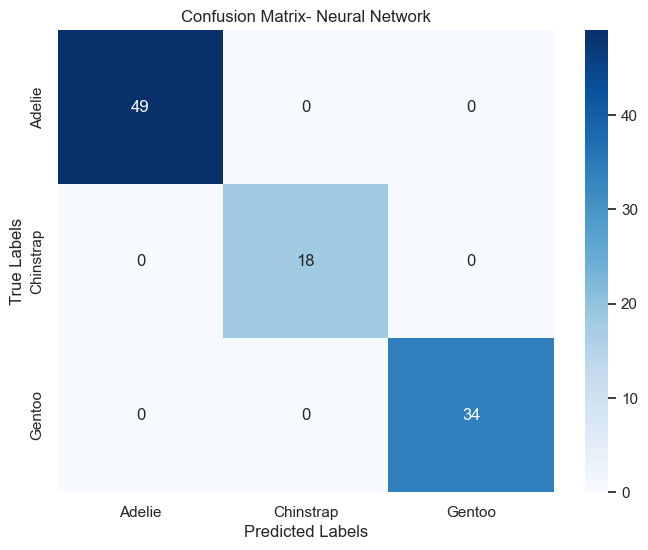

In [24]:
conf_matrix = confusion_matrix(y_true_list, y_pred_list)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_true_list, y_pred_list, target_names=le.classes_)
print('分类报告:')
print(report)
#混淆矩阵可视化
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix- Neural Network')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

## CNN

In [25]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
# 转换为 PyTorch 张量
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).unsqueeze(1).unsqueeze(2)  # 添加通道维度和高度维度
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).unsqueeze(1).unsqueeze(2)    # 添加通道维度和高度维度
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# 创建数据加载器
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# 定义 CNN 模型
class CNN(nn.Module):
    def __init__(self, input_size, num_classes):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv1d(1, 64, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64 * (input_size // 2), num_classes)
    
    def forward(self, x):
        x = x.squeeze(2)  # 移除多余的维度
        out = self.conv1(x)
        out = self.relu(out)
        out = self.pool(out)
        out = out.view(out.size(0), -1)  # 展平
        out = self.fc1(out)
        return out

# 初始化模型、损失函数和优化器
input_size = X_train.shape[1]
num_classes = len(le.classes_)
model = CNN(input_size, num_classes)
print(model)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
losss=[]
# 训练模型
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    for X_batch, y_batch in train_loader:
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
    losss.append(loss.item())

# 评估模型
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        _, predicted = torch.max(outputs.data, 1)
        total += y_batch.size(0)
        correct += (predicted == y_batch).sum().item()

    accuracy = correct / total
    print(f'准确率: {accuracy:.4f}')

# 混淆矩阵和分类报告
y_pred_list = []
y_true_list = []
model.eval()
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        _, predicted = torch.max(outputs.data, 1)
        y_pred_list.extend(predicted.cpu().numpy())
        y_true_list.extend(y_batch.cpu().numpy())

conf_matrix = confusion_matrix(y_true_list, y_pred_list)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_true_list, y_pred_list, target_names=le.classes_)
print('分类报告:')
print(report)


CNN(
  (conv1): Conv1d(1, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (relu): ReLU()
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=256, out_features=3, bias=True)
)
Epoch [1/100], Loss: 0.9733
Epoch [2/100], Loss: 0.5367
Epoch [3/100], Loss: 0.7502
Epoch [4/100], Loss: 0.5480
Epoch [5/100], Loss: 0.5148
Epoch [6/100], Loss: 0.5058
Epoch [7/100], Loss: 0.2645
Epoch [8/100], Loss: 0.2503
Epoch [9/100], Loss: 0.2807
Epoch [10/100], Loss: 0.3552
Epoch [11/100], Loss: 0.2027
Epoch [12/100], Loss: 0.2331
Epoch [13/100], Loss: 0.1882
Epoch [14/100], Loss: 0.2166
Epoch [15/100], Loss: 0.1287
Epoch [16/100], Loss: 0.1543
Epoch [17/100], Loss: 0.2108
Epoch [18/100], Loss: 0.1044
Epoch [19/100], Loss: 0.1220
Epoch [20/100], Loss: 0.1661
Epoch [21/100], Loss: 0.0538
Epoch [22/100], Loss: 0.0310
Epoch [23/100], Loss: 0.1165
Epoch [24/100], Loss: 0.0815
Epoch [25/100], Loss: 0.0936
Epoch [26/100], Loss: 0.0437
Epoch [27/100], 

混淆矩阵:
[[49  0  0]
 [ 0 18  0]
 [ 0  0 34]]
分类报告:
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00        49
   Chinstrap       1.00      1.00      1.00        18
      Gentoo       1.00      1.00      1.00        34

    accuracy                           1.00       101
   macro avg       1.00      1.00      1.00       101
weighted avg       1.00      1.00      1.00       101



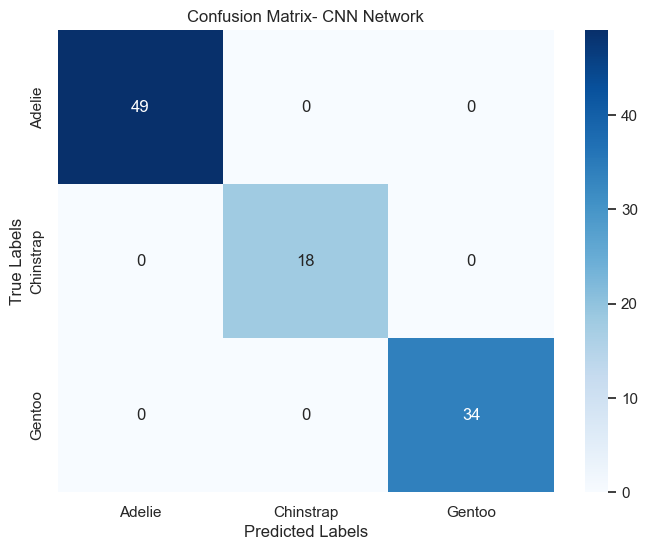

In [26]:
conf_matrix = confusion_matrix(y_true_list, y_pred_list)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_true_list, y_pred_list, target_names=le.classes_)
print('分类报告:')
print(report)
#混淆矩阵可视化
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix- CNN Network')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

In [27]:
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        _, predicted = torch.max(outputs.data, 1)
        y_pred_list.extend(predicted.cpu().numpy())
        y_true_list.extend(y_batch.cpu().numpy())

conf_matrix = confusion_matrix(y_true_list, y_pred_list)
print('混淆矩阵:')
print(conf_matrix)

report = classification_report(y_true_list, y_pred_list, target_names=le.classes_)
print('分类报告:')
print(report)

混淆矩阵:
[[98  0  0]
 [ 0 36  0]
 [ 0  0 68]]
分类报告:
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00        98
   Chinstrap       1.00      1.00      1.00        36
      Gentoo       1.00      1.00      1.00        68

    accuracy                           1.00       202
   macro avg       1.00      1.00      1.00       202
weighted avg       1.00      1.00      1.00       202



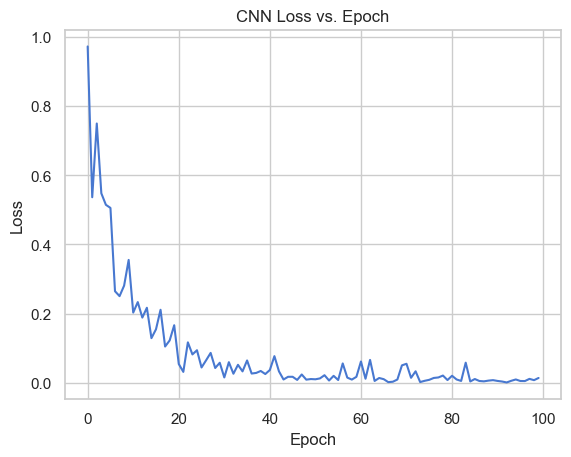

In [28]:
#画出losss的损失函数
plt.plot(losss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('CNN Loss vs. Epoch')
plt.show()
